In [1]:
#| default_exp xae_viz

# XAE (eXploring Audio Embeddings / AutoEncoders): Visualization  I:  10  categories

> Data visualization of embeddings.

Note: No GPU required or used: this whole notebook is run on the ***CPU ONLY.**

In [2]:
is_notebook = True  # runs in both notebook and exported .py

In [3]:
# this cell is for Colab execution
install = False  # can set to false to skip this part, e.g. for re-running in same session
if install:     # ffmpeg is to add MP3 support to Colab
    !yes | sudo apt install ffmpeg 
    !pip install -Uqq einops gdown 
    !pip install -Uqq git+https://github.com/drscotthawley/aeiou@dev   # or however you get dev branch
    !pip install -Uqq git+https://github.com/drscotthawley/audio-algebra # note that we're in a-a now

In [4]:
# this cell is because on the cluster, jupyter schedule affinity defaults to 2 ??
import os
import sys
import multiprocessing

def fix_affinity():
    # 0 means current process
    affinity = os.sched_getaffinity(0)
    if len(affinity) != multiprocessing.cpu_count():
        print("Something has messed with CPU affinity. Current affinity is {}. Fixing".format(affinity),
              file=sys.stderr)
        os.sched_setaffinity(0, set(range(multiprocessing.cpu_count())))

        assert len(os.sched_getaffinity(0)) == multiprocessing.cpu_count(), os.sched_getaffinity(0)
    else:
        print("Affinity is OK: {}".format(affinity))

fix_affinity()
os.environ['NUMBA_NUM_THREADS'] = str(len(os.sched_getaffinity(0)))

Something has messed with CPU affinity. Current affinity is {0, 48}. Fixing


In [5]:
#| export

# standard packages
import os
import math
import numpy as np
import random
import pandas as pd
import plotly
plotly.offline.init_notebook_mode(connected=True) # supposed to help keep plots active but doesn't :shrug: 
import plotly.express as px

import torch
from torch.utils import data as torchdata
import matplotlib.pyplot as plt
import matplotlib.cm as cm

from IPython.display import display, HTML, Audio  # just for displaying inside notebooks
from ipywidgets import interact, widgets

from einops import rearrange
#from tqdm import tqdm
from tqdm.notebook import trange, tqdm
import wandb

import umap
import umap.plot
import umap.utils as utils
import umap.aligned_umap


# my custom audio packages
from aeiou.core import load_audio, get_device
from aeiou.datasets import Stereo, Mono, AudioDataset
from aeiou.viz import playable_spectrogram, audio_spectrogram_image, tokens_spectrogram_image, point_cloud, show_point_cloud, project_down
#from audio_algebra.given_models import GivenModelClass, SpectrogramAE, MagSpectrogramAE, \
#    MagDPhaseSpectrogramAE, MelSpectrogramAE, DVAEWrapper, RAVEWrapper, StackedDiffAEWrapper


In [6]:
# This notebook doesn't use the GPU at all

#device = get_device()
#print(f"device = {device}, CPUs = {os.cpu_count()}, len(sched_affinity) = {len(os.sched_getaffinity(0))}")
#
#VRAM_GB = math.ceil(torch.cuda.get_device_properties(device).total_memory / 1024**3)
#print(f"Total possible VRAM on this GPU ~{VRAM_GB} GB")

# Visualize Embeddings

### Reload prior work

In [7]:
#|export
# which model are we using 

model_names = ['StackedDiffAE', 'DVAE']
model_name = model_names[0]


norm_types = ['loudnorm', 'maxabsnorm']
norm_type = norm_types[0]

print(model_name, norm_type)

StackedDiffAE loudnorm


In [8]:
#|export
if norm_type=='loudnorm':
    path = f'/fsx/shawley/datasets/xae/long_{norm_type}/'
else:
    path = f'/fsx/shawley/datasets/xae/short_{norm_type}/'


num_effects, knobvals = 10,1 
#num_effects, knobvals = 4, 32

file_stem = path+f"{num_effects}effects_{knobvals}knobvals"
file_stem

'/fsx/shawley/datasets/xae/long_loudnorm/10effects_1knobvals'

In [9]:
main_df = pd.read_pickle(f'{file_stem}_df.pkl')
pd.set_option('display.max_colwidth', None)
df = main_df
main_df

,sample,filename,effect,knob_name,kval,others,instrument
0,0,00_BN1-129-Eb_comp_mic--0.wav,Clean,no_op,1,{},Guitar
1,1,00_BN1-129-Eb_comp_mic--3.wav,Clean,no_op,1,{},Guitar
2,2,00_BN1-129-Eb_solo_mic--1.wav,Clean,no_op,1,{},Guitar
3,3,00_BN1-147-Gb_solo_mic--2.wav,Clean,no_op,1,{},Guitar
4,4,00_BN2-131-B_comp_mic--2.wav,Clean,no_op,1,{},Guitar
...,...,...,...,...,...,...,...
10235,1019,MIDI-Unprocessed_Recital5-7_MID--AUDIO_07_R1_2018_wav--1--55.wav,TimeReverse,do_reverse,1,{},Piano
10236,1020,MIDI-Unprocessed_Recital5-7_MID--AUDIO_07_R1_2018_wav--1--56.wav,TimeReverse,do_reverse,1,{},Piano
10237,1021,MIDI-Unprocessed_Recital5-7_MID--AUDIO_07_R1_2018_wav--1--57.wav,TimeReverse,do_reverse,1,{},Piano
10238,1022,MIDI-Unprocessed_Recital5-7_MID--AUDIO_07_R1_2018_wav--1--58.wav,TimeReverse,do_reverse,1,{},Piano


In [10]:
mstr = 'stacked' if 'stacked' in model_name.lower() else 'dvae'
fullname = f'{file_stem}_{mstr}_reps.npy'
print(f"Reading reps from {fullname}")
reps_full = torch.from_numpy(np.load(fullname)) #,mmap_mode='r')) # map mode for low RAM but will be slow to do projections
reps_full.shape

Reading reps from /fsx/shawley/datasets/xae/long_loudnorm/10effects_1knobvals_stacked_reps.npy


torch.Size([10240, 32, 512])

### Check the data 

In [11]:
#|export
# check for nans
assert 0 == len(torch.nonzero(torch.isnan(reps_full.view(-1)))), "You've got NaNs"
print("No NaNs! Good to go. ")

No NaNs! Good to go. 


In [12]:
def nb_play(waveform, sample_rate=48000):
    if is_notebook: 
        if waveform is torch.Tensor: waveform = waveform.cpu().numpy()
        display(Audio(waveform.clip(-1,1), rate=sample_rate, normalize=False))
        plt.plot(waveform[0]) # just left channel for now
        plt.show()
        display(audio_spectrogram_image(torch.from_numpy(waveform), justimage=False, db=False, db_range=[-60,20]))


len_orig = 1024
ind =  932
df_line = sample                                                                      932
filename      MIDI-Unprocessed_Recital5-7_MID--AUDIO_07_R1_2018_wav--1--134.wav
effect                                                                    Clean
knob_name                                                                 no_op
kval                                                                          1
others                                                                       {}
instrument                                                                Piano
Name: 932, dtype: object


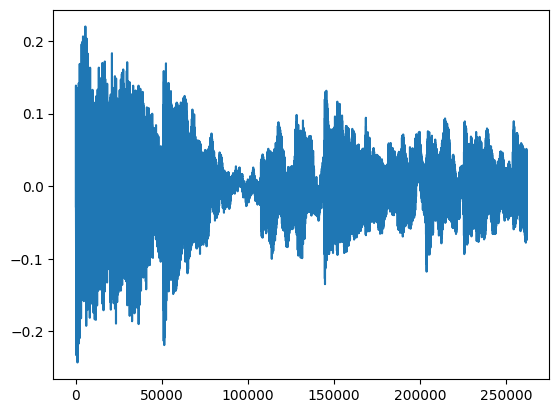

/tmp/ipykernel_2422730/2618136867.py:7: UserWarning:

The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:199.)

/admin/home-shawley/envs/aa/lib/python3.9/site-packages/torchaudio/functional/functional.py:571: UserWarning:

At least one mel filterbank has all zero values. The value for `n_mels` (128) may be set too high. Or, the value for `n_freqs` (513) may be set too low.



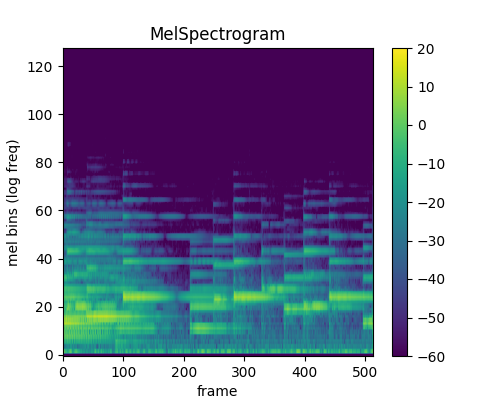

ind =  1956
df_line = sample                                                                      932
filename      MIDI-Unprocessed_Recital5-7_MID--AUDIO_07_R1_2018_wav--1--134.wav
effect                                                               Distortion
knob_name                                                              drive_db
kval                                                                         25
others                                                                       {}
instrument                                                                Piano
Name: 1956, dtype: object


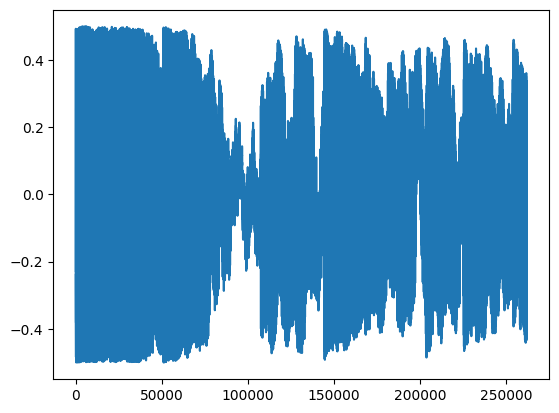

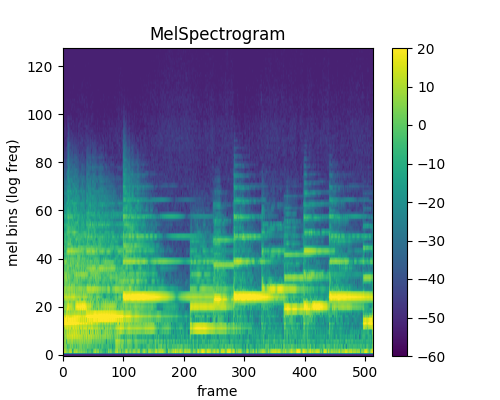

ind =  2980
df_line = sample                                                                      932
filename      MIDI-Unprocessed_Recital5-7_MID--AUDIO_07_R1_2018_wav--1--134.wav
effect                                                                   Reverb
knob_name                                                             room_size
kval                                                                        0.8
others                                                                       {}
instrument                                                                Piano
Name: 2980, dtype: object


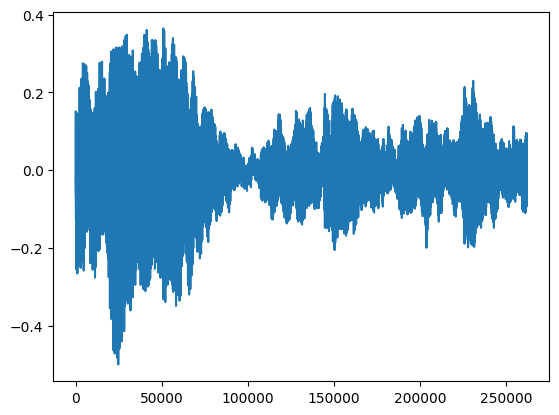

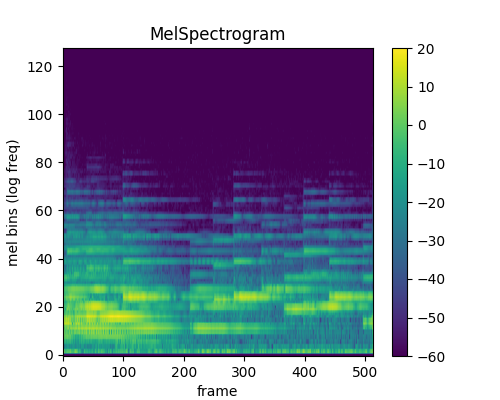

ind =  4004
df_line = sample                                                                      932
filename      MIDI-Unprocessed_Recital5-7_MID--AUDIO_07_R1_2018_wav--1--134.wav
effect                                                           HighpassFilter
knob_name                                                   cutoff_frequency_hz
kval                                                                       2000
others                                                                       {}
instrument                                                                Piano
Name: 4004, dtype: object


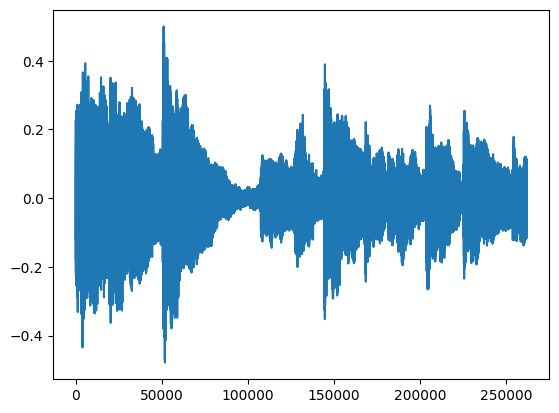

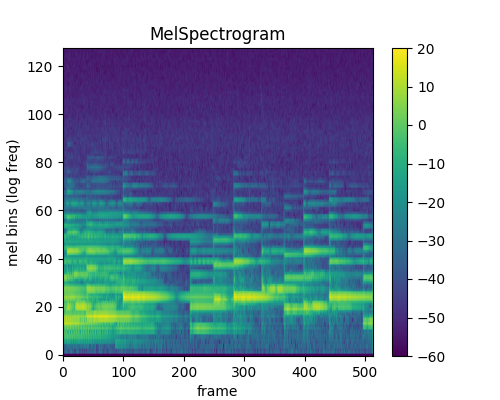

ind =  5028
df_line = sample                                                                      932
filename      MIDI-Unprocessed_Recital5-7_MID--AUDIO_07_R1_2018_wav--1--134.wav
effect                                                            LowpassFilter
knob_name                                                   cutoff_frequency_hz
kval                                                                         70
others                                                                       {}
instrument                                                                Piano
Name: 5028, dtype: object


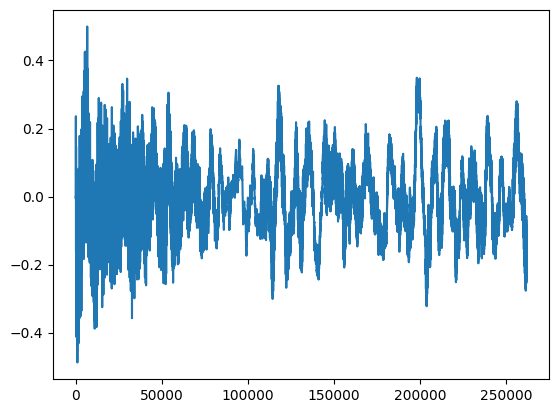

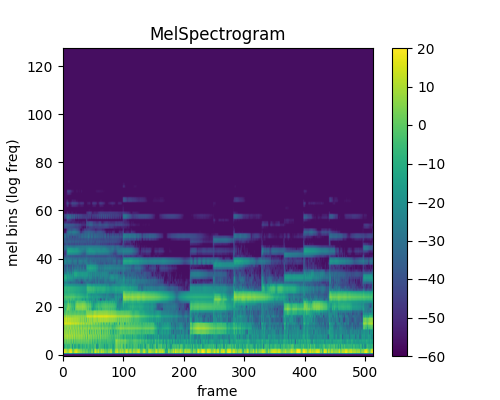

ind =  6052
df_line = sample                                                                      932
filename      MIDI-Unprocessed_Recital5-7_MID--AUDIO_07_R1_2018_wav--1--134.wav
effect                                                               Compressor
knob_name                                                          threshold_db
kval                                                                        -50
others                                                            {'ratio': 25}
instrument                                                                Piano
Name: 6052, dtype: object


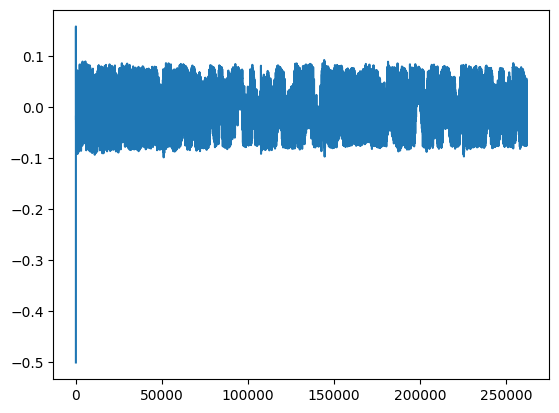

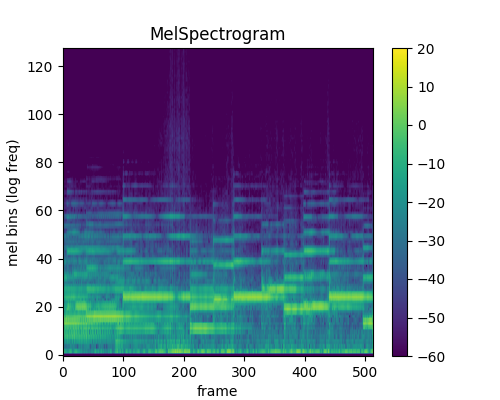

ind =  7076
df_line = sample                                                                      932
filename      MIDI-Unprocessed_Recital5-7_MID--AUDIO_07_R1_2018_wav--1--134.wav
effect                                                                   Chorus
knob_name                                                               rate_hz
kval                                                                          1
others                                                                       {}
instrument                                                                Piano
Name: 7076, dtype: object


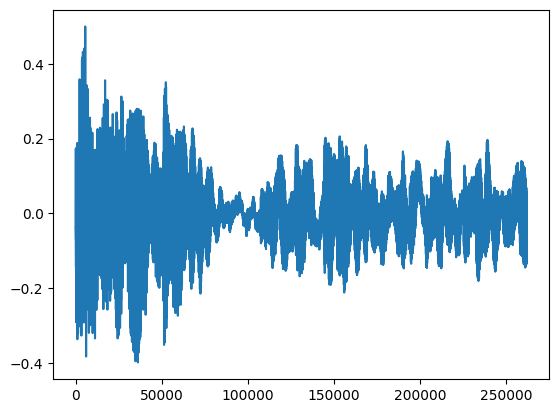

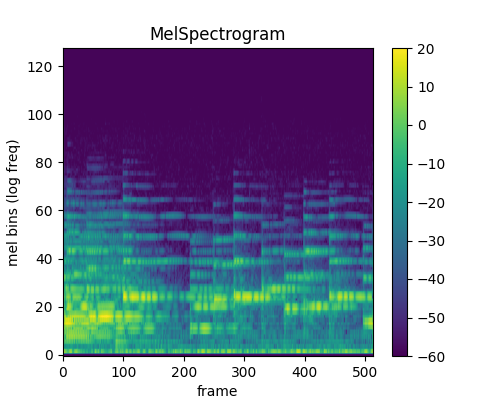

ind =  8100
df_line = sample                                                                      932
filename      MIDI-Unprocessed_Recital5-7_MID--AUDIO_07_R1_2018_wav--1--134.wav
effect                                                                    Delay
knob_name                                                         delay_seconds
kval                                                                        0.5
others                                                                       {}
instrument                                                                Piano
Name: 8100, dtype: object


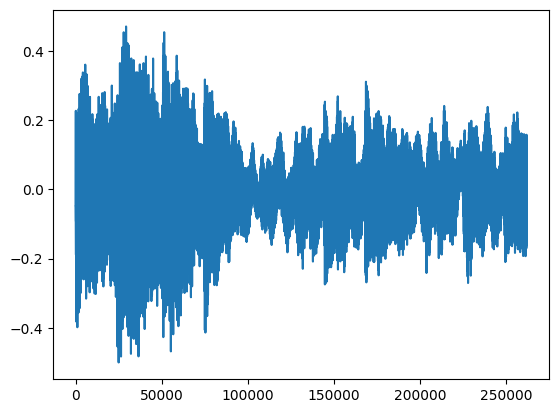

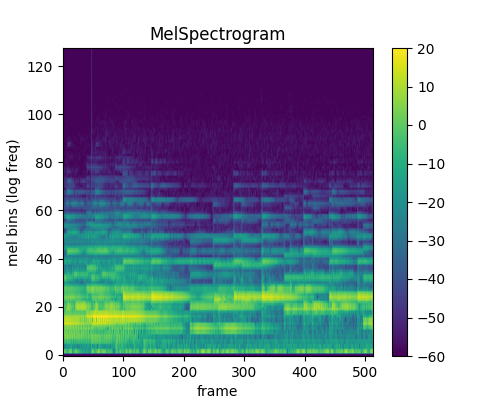

ind =  9124
df_line = sample                                                                      932
filename      MIDI-Unprocessed_Recital5-7_MID--AUDIO_07_R1_2018_wav--1--134.wav
effect                                                               PitchShift
knob_name                                                             semitones
kval                                                                          4
others                                                                       {}
instrument                                                                Piano
Name: 9124, dtype: object


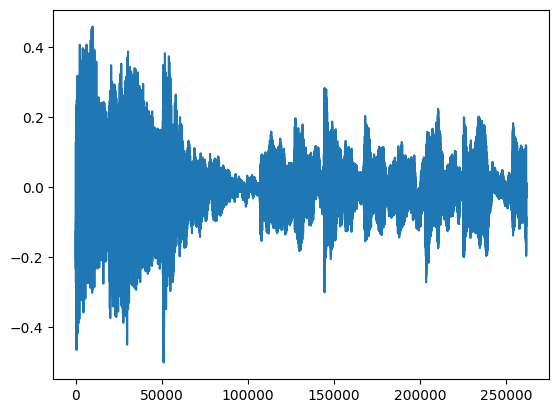

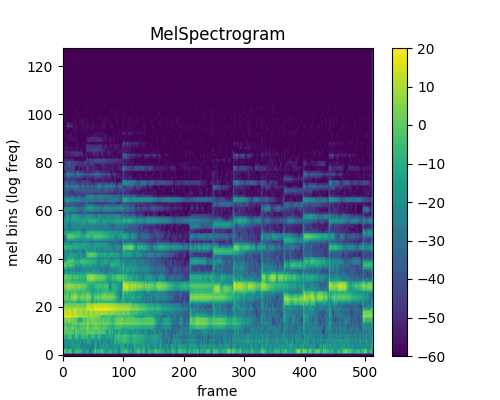

ind =  10148
df_line = sample                                                                      932
filename      MIDI-Unprocessed_Recital5-7_MID--AUDIO_07_R1_2018_wav--1--134.wav
effect                                                              TimeReverse
knob_name                                                            do_reverse
kval                                                                          1
others                                                                       {}
instrument                                                                Piano
Name: 10148, dtype: object


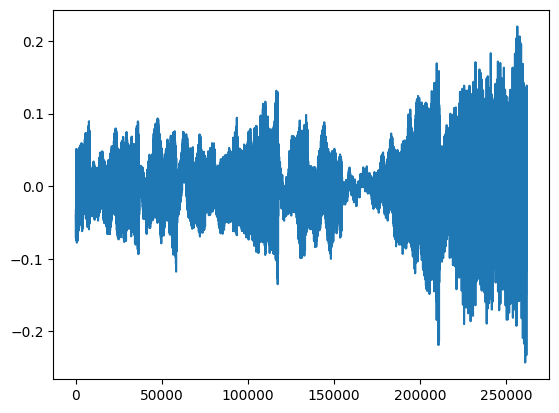

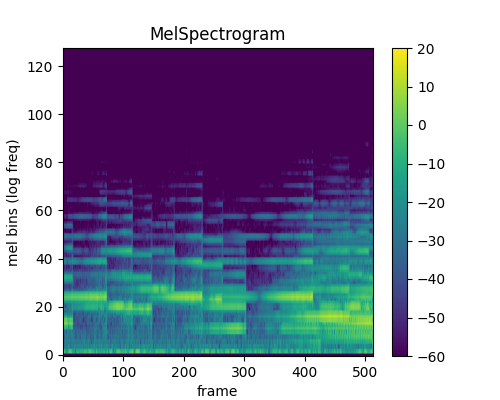

In [13]:
# check that labels are in the dataframe match up with the audio
audio_full = np.load(f'{file_stem}_audio.npy', mmap_mode='r') # mmap because we only check a few


len_orig = len(df)//num_effects
print("len_orig =",len_orig)
assert len_orig==1024   # length of dataset this is made for

i_start = random.randint(0,len_orig)
for i in range(num_effects):
    df = main_df
    ind =  i_start + i*len_orig
    print("ind = ",ind)
    audio = audio_full[ind]
    df_line = df.iloc[ind]
    print("df_line =",df_line)
    nb_play(audio)

In [14]:
# check hpf guitar data
hpf_guitar_df = df[df['instrument'].str.contains('Guitar')]
hpf_guitar_df = hpf_guitar_df[hpf_guitar_df['effect'].str.contains('HighpassFilter')]
hpf_guitar_df

,sample,filename,effect,knob_name,kval,others,instrument
3072,0,00_BN1-129-Eb_comp_mic--0.wav,HighpassFilter,cutoff_frequency_hz,2000,{},Guitar
3073,1,00_BN1-129-Eb_comp_mic--3.wav,HighpassFilter,cutoff_frequency_hz,2000,{},Guitar
3074,2,00_BN1-129-Eb_solo_mic--1.wav,HighpassFilter,cutoff_frequency_hz,2000,{},Guitar
3075,3,00_BN1-147-Gb_solo_mic--2.wav,HighpassFilter,cutoff_frequency_hz,2000,{},Guitar
3076,4,00_BN2-131-B_comp_mic--2.wav,HighpassFilter,cutoff_frequency_hz,2000,{},Guitar
...,...,...,...,...,...,...,...
3579,507,05_SS3-84-Bb_solo_mic--3.wav,HighpassFilter,cutoff_frequency_hz,2000,{},Guitar
3580,508,05_SS3-98-C_comp_mic--0.wav,HighpassFilter,cutoff_frequency_hz,2000,{},Guitar
3581,509,05_SS3-98-C_comp_mic--6.wav,HighpassFilter,cutoff_frequency_hz,2000,{},Guitar
3582,510,05_SS3-98-C_solo_mic--1.wav,HighpassFilter,cutoff_frequency_hz,2000,{},Guitar


ind = 3581


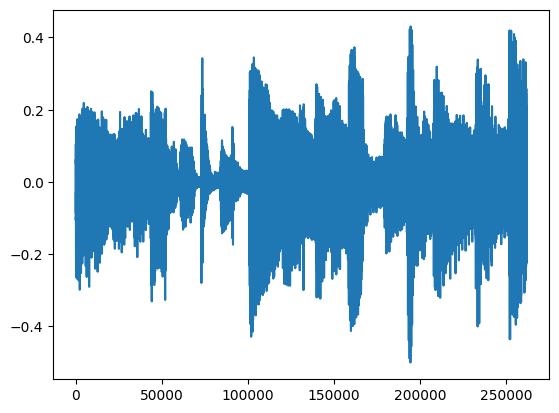

/admin/home-shawley/envs/aa/lib/python3.9/site-packages/torchaudio/functional/functional.py:571: UserWarning:

At least one mel filterbank has all zero values. The value for `n_mels` (128) may be set too high. Or, the value for `n_freqs` (513) may be set too low.



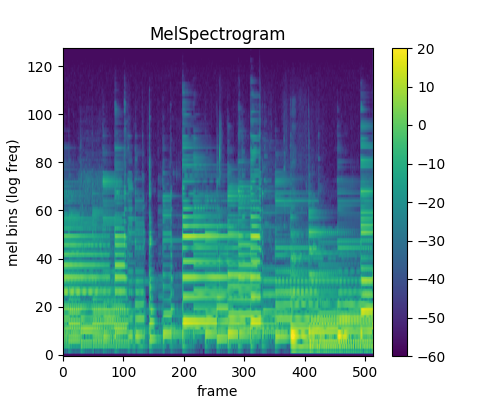

In [15]:
ind = hpf_guitar_df.index[509]
print("ind =",ind)
nb_play(audio_full[ind])

Shall we use Weights & biases? 

In [16]:
#|export
use_wandb = False
if use_wandb: wandb.init(project='xae-viz')
#if use_wandb: wandb.init(project="audio-UMAP-plots", entity='belmont_data') # to share with Belmont students

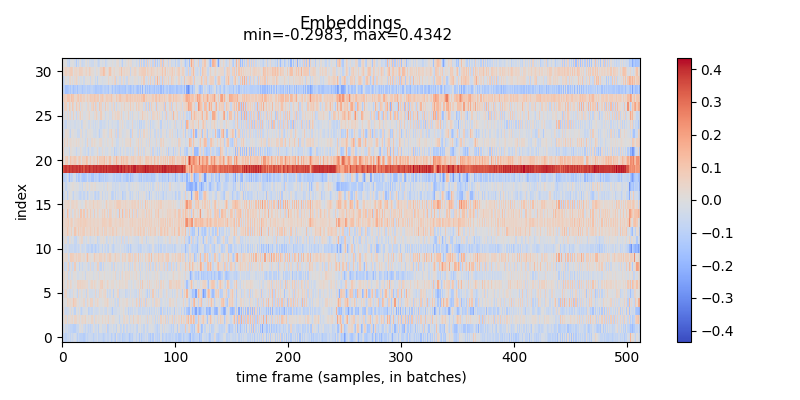

In [17]:
#|export
im = tokens_spectrogram_image(reps_full[0].unsqueeze(0), symmetric=True)
if use_wandb: wandb.log({'sample_reps':wandb.Image(im)})
im

## Instrument selection

Decide which instruments will be included:

In [18]:
#|export
# subsets by instrument
guitar_df = main_df[main_df['instrument'].str.contains('Guitar')]
guitar_indices = guitar_df.index.tolist()
guitar_reps = reps_full[guitar_indices]
print("guitar_reps.shape = ",guitar_reps.shape)

piano_df = main_df[main_df['instrument'].str.contains('Piano')]
piano_indices = piano_df.index.tolist()
piano_reps = reps_full[piano_indices]
print("piano_reps.shape = ",piano_reps.shape)

assert guitar_reps.shape[0]+piano_reps.shape[0] == reps_full.shape[0]


# HERE: which instruments do we want going forward?
full, df = reps_full, main_df  # everything
#full, df = guitar_reps, guitar_df   # just guitars
#full, df = piano_reps, piano_df   # just pianos

instruments_str = str(sorted(list(set(df['instrument'])))).replace('[','').replace(']','').replace(',',' and').replace("'","")
print("\nWe'll be using",instruments_str)

guitar_reps.shape =  torch.Size([5120, 32, 512])
piano_reps.shape =  torch.Size([5120, 32, 512])

We'll be using Guitar and Piano


## Means
Compute averages along time axis

In [19]:
# MERELY a SANITY CHECK to try agree with previous edition of plots for shorter audio clips, chop off the '469' as '128':
shorter_samples = False # leave false unless performing a sanity check
if shorter_samples:
    max_n = 128
else:
    max_n = full.shape[-1]

In [20]:
#|export
def do_time_avg(full, # reps 
                time_bins=1,    # time-averaging sections. 1=average over all time,  3 = early, middle, & late, etc..., max_n = no averaging
                max_n=None,     # time index to stop at
               ):
    time_means = None
    if (max_n is None) or (max_n < 1): 
        max_n = full.shape[-1]
    if time_bins < 1:
        time_bins = max_n
        
    if time_bins != max_n:
        for ti in range(time_bins):
            interval = max_n//time_bins
            start, end = ti*interval, min( (ti+1)*interval, max_n)
            time_bin = torch.mean(full[:,:,start:end], dim=(2)).unsqueeze(-1) # early, middle, late averages
            time_means = time_bin if time_means is None else torch.cat([time_means, time_bin] ,dim=(2))
    else:
        time_means = full[:,:,:max_n]
    print(f"do_time_avg: returning time_means, .shape [b, d, n] =",time_means.shape)
    return time_means

#### if doing multiple knob values, skip this next cell for now

In [29]:
#|export
time_means = do_time_avg(full, time_bins=1, max_n=max_n)
proj_type = 'averages' if  time_means.shape[-1]==1 else 'high-dim'
print("proj_type =",proj_type)

do_time_avg: returning time_means, .shape [b, d, n] = torch.Size([10240, 32, 1])
proj_type = averages


### Define plotting routines

In [32]:
#|export
# utility for PCA & UMAP
def add_proj_to_df(proj_data, df, prefix='PC'):
    proj_dims = proj_data.shape[-1]
    proj_df = df.copy() # just in case
    for i in range(proj_dims):
        proj_df[f'{prefix}_{i+1}'] = proj_data[:,i]
    if proj_dims < 3:  proj_df[f'{prefix}_3'] = 0*proj_data[:,0]
    return proj_df


# to allow for spherical positioning for camera rotations
def sph_to_cart(r,theta,phi):
    x = r*np.sin(theta)*np.cos(phi)
    y = r*np.sin(theta)*np.sin(phi)
    z = r*np.cos(theta)
    return x, y, z

def xyz_to_camera(xyz):
    x,y,z = xyz
    camera = dict(
        up=dict(x=0, y=0, z=1),
        center=dict(x=0, y=0, z=0),
        eye=dict(x=x, y=y, z=z)
        )
    return camera

def sph_to_camera(r,theta,phi):
    x, y, z = sph_to_cart(r,theta,phi)
    return xyz_to_camera(x,y,z)



def make_pca_plotly(time_means, 
                    df,
    proj_dims = 3,  # dimensionality we're projecting into
    proj_type = 'averages',   # 'high-dim' # high dimensional points, each spectrogram as single point in d*n-dimensional space
    drop_post=[], # allow us to 'drop' certain effects before the projection
    drop_pre=['Clean','TimeReverse'], # drop these effects after projection
    xyz=(0,-1.25,0.55), # camera position
    pca_means_df=None, # if none we re-do the projection. otherwise we skip the projection and just re-do the plot.
    ):
    if pca_means_df is None:
        print("pca_means_df is None:",pca_means_df)
        print("proj_type = ",proj_type)
        if proj_type == 'high-dim':
            A = rearrange(time_means, 'b d n -> b (d n)') # treat each spectrogram as single point in d*n-dimensional space
        else:
            A = rearrange(time_means, 'b d n -> (b n) d') # group time averages as d-dim individual vectors
        if len(A.shape) < 3: A = A.unsqueeze(-1) 

        filtered_df, filtered_A = df, A  
        for dropit in drop_pre:
            filtered_df = filtered_df[filtered_df["effect"].str.contains(dropit) == False].reset_index(drop=True)
            filtered_A = filtered_A[filtered_df.index.tolist()]


        print(f"time_means.shape = {time_means.shape}, filtered_A.shape = {filtered_A.shape}")
        #do the projection
        pca_time_means = project_down(filtered_A, method='pca', proj_dims=proj_dims).squeeze()
        print(f"pca_time_means (i.e. proj_data) .shape = ",pca_time_means.shape)

        print("pca_time_means.shape =",pca_time_means.shape)
        pca_means_df = add_proj_to_df(pca_time_means, filtered_df)
        #print(pca_means_df.iloc[0])

    # if you go away and come back you'll lose some plotly plots
    fig = px.scatter_3d(pca_means_df, x='PC_1', y='PC_2', z='PC_3', color='effect',  #color_discrete_map=colors_dict, 
                        labels='effect', opacity=1,  width=1000, height=800, 
                        symbol='instrument', symbol_sequence= ['circle-open', 'cross', 'circle', 'circle-open-dot', ],
                        hover_data=['sample','instrument','effect'], size_max=10
                       )
    fig.update_traces(marker=dict(size=4,  opacity=1.0, line=dict(width=0, color='DarkSlateGray')), selector=dict(mode='markers'))
    fig.update_traces(textposition='top center')
    fig.update_layout(legend={'itemsizing': 'constant'}, height=800, title_text=instruments_str)
    fig.update_layout(scene_camera=xyz_to_camera(xyz)) # works ok 
    if use_wandb: 
        #wandb.log({"pca_time_means":fig})
        myfig = wandb.Plotly(fig, caption=f"{given_model.name}PCA_{proj_type}")
        wandb.log({"pca_plots": myfig})  
    return fig, pca_means_df




#%%time
#@widgets.interact
def make_umap_plotly(
    time_means, # our data to plot
    df,
    n_neighbors = 50, 
    min_dist = 0.5, 
    proj_type='averages',
    proj_dims=3, 
    drop_pre=[], # allow us to 'drop' certain effects before the projection
    drop_post=['Clean','TimeReverse'], # drop these effects after projection
    umap_means_df = None, # if passed it it only re-does the plot
    xyz=(-1,-.7,1), # default camera eye position for stacked model
    ):
    
    param_str = f"{proj_type}: nn_neighbors = {n_neighbors}, min_dist = {min_dist}, Instruments = {instruments_str}"
    print(f"make_umap_plotly: {param_str}")

    print("proj_type = ",proj_type)
    if proj_type == 'high-dim':
        A = rearrange(time_means, 'b d n -> b (d n)') # treat each spectrogram as single point in d*n-dimensional space
    else:
        A = rearrange(time_means, 'b d n -> (b n) d') # group time averages as d-dim individual vectors
    #A = A.unsqueeze(-1)  # not for umap

    print("Before UMAP, A.shape =",A.shape)
    
    if umap_means_df is None:
        filtered_df, filtered_A = df, A  
        for dropit in drop_pre:
            filtered_df = filtered_df[filtered_df["effect"].str.contains(dropit) == False].reset_index(drop=True)    
            filtered_A = filtered_A[filtered_df.index.tolist()]
        mapper = umap.UMAP(n_components=proj_dims, n_neighbors=n_neighbors, min_dist=min_dist, metric='correlation').fit(filtered_A)
        umap_proj_data = mapper.transform(filtered_A)

        umap_time_means =  torch.reshape(torch.from_numpy(umap_proj_data), (filtered_A.shape[0], -1, proj_dims)).squeeze()
        umap_means_df = add_proj_to_df(umap_time_means, filtered_df, prefix='UMAP')

    for dropit in drop_post:
        umap_means_df = umap_means_df[umap_means_df["effect"].str.contains(dropit) == False]    
 
    fig = px.scatter_3d(umap_means_df, x='UMAP_1', y='UMAP_2', z='UMAP_3', labels='effect', color='effect', 
                    symbol='instrument', symbol_sequence= ['circle-open', 'cross', 'circle', 'circle-open-dot', ],
                    hover_data=['sample','instrument','effect'], opacity=1, size_max=10,  width=1000, height=800,
                       )#title={'text':param_str, 'automargin':True})
    fig.update_layout( title=dict(text=param_str, font=dict(size=14), automargin=True, yref='paper') )
    fig.update_traces(marker=dict(size=4.5,  opacity=1, line=dict(width=0, color='DarkSlateGrey')), selector=dict(mode='markers'))
    fig.update_layout(legend= {'itemsizing': 'constant'})
    fig.update_traces(textposition='top center')
    fig.update_layout(scene_camera=xyz_to_camera(xyz)) # works ok 
    
    if use_wandb: wandb.log({f"umap_time_means_nn{n_neighbors}_md{min_dist}":fig})
    return fig, umap_means_df

## Plot PCA

In [33]:
#|export
xyz = (0,-1.25,1.65) if mstr=='dvae' else  (-.8,-.5,1.1) 
pca_means_df = None
fig, pca_means_df = make_pca_plotly(time_means, df, proj_type=proj_type, xyz=xyz,pca_means_df=pca_means_df)
fig.show()

pca_means_df is None: None
proj_type =  averages
time_means.shape = torch.Size([10240, 32, 1]), filtered_A.shape = torch.Size([8192, 32, 1])
pca_time_means (i.e. proj_data) .shape =  torch.Size([8192, 3])
pca_time_means.shape = torch.Size([8192, 3])


In [24]:
#|export
filename = f"PCA_{proj_type}_{mstr}_{num_effects}effects{knobvals}knobvals_{instruments_str}.pdf".replace(' ','_')
print(f"Writing to {filename}")
#fig.write_image(filename) # note this will be default view

Writing to PCA_averages_stacked_10effects1knobvals_Guitar_and_Piano.pdf


## 3d matplotlib scatter plot

In [25]:
# allows for a bit of interactivity, but is slow & often breaks everything
#%matplotlib notebook 

In [26]:
do_mpl_3d = False # False means skip this bit

if do_mpl_3d: 
    effect_names = list(set(df['effect']))

    fig = plt.figure(figsize=(10,7))
    ax = fig.add_subplot(projection="3d")

    def get_effect_points(df, effect_name):
        df = df[df['effect'].str.contains(effect_name)]
        X = df['PC_1'].tolist()
        Y = df['PC_2'].tolist()
        Z = df['PC_3'].tolist()
        return X, Y, Z 

    C = [effect_names.index(x) for x in pca_means_df['effect'].tolist()]
    A = [i/10 for i in range(10)]

    for name in effect_names:
        X, Y, Z  = get_effect_points(pca_means_df, name)
        ax.scatter(xs=X, ys=Y, zs=Z, label=name, alpha=0.5)
    #sc = ax.scatter(xs=X, ys=Y, zs=Z, c=C, cmap=cm.tab20) # , s=S, alpha=A)
    #plt.colorbar(sc)
    plt.legend(loc='upper left')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

    plt.show()

In [27]:
assert False, 'Pause here'

AssertionError: Pause here

## Plot UMAP

In [ ]:
#for n_neighbors in [10,20,50,100,200]:
#    for min_dist in [0.3,0.5, 0.75, 0.9]:

n_neighbors, min_dist = 50, 0.5
xyz = (1.2,-.7,.9) if mstr=='dvae' else (-1,-.7,1)
print(xyz)
umap_means_df = None  # non-none only for redo-ing view
fig, umap_means_df = make_umap_plotly(time_means,df,n_neighbors=n_neighbors, min_dist=min_dist, xyz=xyz, proj_type=proj_type, drop_post=['Clean','TimeReverse'], umap_means_df=umap_means_df)
fig.show()

In [ ]:
filename = f"UMAP_{proj_type}_{mstr}_{num_effects}effects{knobvals}knobvals_{instruments_str}_nn{n_neighbors}_md{min_dist}.pdf".replace(' ','_').replace('0.','0,')
print(f"Writing to {filename}")
fig.write_image(f"{filename}") # note this will be default view

In [ ]:
wandb.finish()

# 2D UMAP plots


In [ ]:
#%%time
#from bokeh.io import show
#from ipywidgets import interact

do_2d_umaps=False

if do_2d_umaps:
    if proj_type == 'high-dim':
        A = rearrange(time_means, 'b d n -> b (d n)') # treat each spectrogram as single point in d*n-dimensional space
    else:
        A = rearrange(time_means, 'b d n -> (b n) d') # group time averages as d-dim individual vectors
    #A = A.unsqueeze(-1)  # not for umap

    A2 = A
    filtered_df, filtered_A, mapper2d = df, A2, None

    #@interact(continuous_update=False, n_neighbors=(10,200), min_dist=(0.0,0.99,0.01)) # breaks the nb :'-( '
    def make_umap_2d(n_neighbors=50, min_dist=0.500,  drop_pre='Clean, TimeReverse'
                    ): # todo: can't figure out how to to drop post
        global filtered_df, filtered_A, mapper2d
        param_str = f"nn_neighbors = {n_neighbors}, min_dist = {min_dist}, Instruments = {instruments_str}"
        drop_pre =  [x.strip() for x in drop_pre.split(',')]
        print(f"{param_str}")

        filtered_df, filtered_A = df, A2
        for dropit in drop_pre:
            filtered_df = filtered_df[filtered_df["effect"].str.contains(dropit) == False]    
            filtered_A = filtered_A[filtered_df.index.tolist()]

        mapper2d = umap.UMAP(n_components=2, n_neighbors=n_neighbors, min_dist=min_dist,
                                    metric='correlation').fit(filtered_A)
        #data2d = mapper2d.transform(filtered_A)
        umap.plot.output_notebook()
        return umap.plot.points(mapper2d, labels=filtered_df['effect'])        

    make_umap_2d(n_neighbors=150, min_dist=0.7,  drop_pre='Clean, TimeReverse')

Next up: Interactive version of above 2d plot with mouseover

Thankfully we already computed "mapper2d" in the previous cell, so this can go fast. 


In [ ]:
if do_2d_umaps:

    hover_data = pd.DataFrame({'label':filtered_df['effect'].tolist(),
                               'sample':filtered_df['sample'].tolist(), 
                               'instrument':filtered_df['instrument'].tolist()
                              })
    labels=filtered_df['effect'].tolist()
    p = umap.plot.interactive(mapper2d, labels=labels, hover_data=hover_data, point_size=3)
    umap.plot.show(p)

### 2D UMAP diagnostics

In [ ]:
#umap.plot.connectivity(mapper2d, show_points=True)

In [ ]:
#umap.plot.connectivity(mapper2d, edge_bundling='hammer') #slowwww

In [ ]:
#umap.plot.diagnostic(mapper2d, diagnostic_type='pca')

In [ ]:
#umap.plot.diagnostic(mapper2d, diagnostic_type='vq')

In [ ]:
#local_dims = umap.plot.diagnostic(mapper2d, diagnostic_type='local_dim')

In [ ]:
#umap.plot.diagnostic(mapper2d, diagnostic_type='neighborhood')

# Flattened / High-Dim (incl UMAP "ball" plot)

used for 10effects1knobvals

In [ ]:
assert knobvals==1,"You're doing the wrong plot, buddy"

In [ ]:

time_means = do_time_avg(full, time_bins=-1, max_n=max_n) # use max_n=128 to compare with old/original dvae plots
#make_pca_plotly(time_means)
proj_type = 'averages' if  time_means.shape[-1]==1 else 'high-dim' 
print(proj_type)

first try PCA

In [ ]:
xyz = (0,-1,-1) if mstr=='dvae' else (0,-1.55,0.55)
fig, pca_means_df = make_pca_plotly(time_means, df, proj_type='high-dim', xyz=xyz, pca_means_df=None)
fig.show()

In [ ]:
filename = f"PCA_{proj_type}_{mstr}_{num_effects}effects{knobvals}knobvals_{instruments_str}.pdf".replace(' ','_')
print(f"Writing to {filename}")
fig.write_image(f"{filename}") # note this will be default view

now UMAP

In [ ]:
n_neighbors, min_dist = 20, 0.3
umap_means_df = None  # none will redo the umap
xyz = (0,.95,-.95) if mstr=='dvae' else (0,-1.55,0.55)
fig, umap_means_df = make_umap_plotly(time_means,df,n_neighbors=n_neighbors, min_dist=min_dist, proj_type='high-dim', drop_post=['Clean','TimeReverse'], umap_means_df=umap_means_df,xyz=xyz)
fig.show()

In [ ]:
filename = f"UMAP_{proj_type}_{mstr}_{num_effects}effects{knobvals}knobvals_{instruments_str}_nn{n_neighbors}_md{min_dist}.pdf".replace(" ","_").replace('0.','0,')
print(f"Writing to {filename}")
fig.write_image(f"{filename}") # note this will be default view

In [ ]:
# keep this nb running
count=0
from time import sleep 
while True:
    count+=1
    print(f"\r Hey {count}",end="",flush=True)
    sleep(5)

# Varying Effects: Many knob values for Single Effect, many samples

In [ ]:
# do projection over all samples, all instruments, all effects
pca_time_means = project_down(time_means, method='pca', proj_dims=3).squeeze()
pca_means_df = add_proj_to_df(pca_time_means, df)

In [ ]:
len(set(df['kval'])), len(set(df['effect']))

In [ ]:
knob_names = {
    'Distortion': {'knob_name': 'drive_db', 'min': 0, 'max': 30, 'default':25},
    'Reverb': {'knob_name': 'room_size', 'min': 0, 'max': 0.99, 'default':0.8},
    'HighpassFilter': {'knob_name': 'cutoff_frequency_hz', 'min': 50, 'max': 10000, 'default':2000},
    'LowpassFilter': {'knob_name': 'cutoff_frequency_hz', 'min': 40, 'max': 20000, 'default':70},
}

In [ ]:
assert len(set(df['kval']))> len(set(df['effect'])),"Wrong dataset. Not enough knob values to show variations. Go back and re-load the correct dataset"

In [ ]:
def get_instrument(df,instrument='Guitar'):
    return df[df['instrument'].str.contains(instrument)]

def get_effect(df,effect='Distortion'):
    return df[df['effect'].str.contains(effect)]

effect_name = 'Reverb'
edf = get_effect(pca_means_df,effect=effect_name)

#instrument = 'Guitar'
#einst_df = get_instrument(edf,instrument=instrument)
einst_df = edf

In [ ]:
#e_time_means = time_means[edf.index.tolist()]
#print("e_time_means.shape =",e_time_means.shape)
#e_pca_time_means = project_down(e_time_means, method='pca', proj_dims=3).squeeze()

In [ ]:
n_samples = len(set(edf['filename']))
print(len(set(edf['filename'])), len(set(edf['sample'])))
assert len(edf)==n_samples*knobvals, f'{len(edf)} should equal {n_samples*knobvals}'

In [ ]:
n_notes = n_samples//16  # how many paths to plot
plot_df = einst_df # which df will we plot
n_samples = len(set(plot_df['sample']))
assert (n_samples//n_notes)*n_notes == n_samples # make sure n_samples is evenly divisible by n_notes

In [ ]:
cmaps = ['gray','inferno','viridis','plotly3','ice'] # colormaps for different effects
kinfo = knob_names[effect_name]
knob_name, kmin, kmax = kinfo['knob_name'], kinfo['min'], kinfo['max']
print("knob_name =",knob_name)
plot_df[knob_name] = plot_df['kval'] # this bit of trickery is just to get the colorbar titles to come out right
 
scale = cmaps[['Clean','Distortion','Reverb','LowpassFilter','HighpassFilter'].index(effect_name)]
fig = px.scatter_3d(plot_df[::n_samples//n_notes], x='PC_1', y='PC_2', z='PC_3', color=knob_name, 
                    labels='knob_name', opacity=1,  color_continuous_scale=scale,
                    symbol='instrument', symbol_sequence= ['circle-open', 'cross', 'circle', 'circle-open-dot', ],
                    hover_data=['sample','instrument'], size_max=10)
fig.update_traces(marker=dict(size=4, opacity=1,  line=dict(width=0, color='DarkSlateGrey')), selector=dict(mode='markers'))
title_str = f"{effect_name}"
fig.update_layout( title=dict(text=title_str, font=dict(size=14), automargin=True, yref='paper') )
#fig.update_layout(showlegend=False)
fig.update_layout(legend=dict(itemsizing="constant",bgcolor='rgba(0,0,0,0)',
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.1
))

# camera settings for reproducing plots
if mstr == 'stacked':
    xyz = (-1,0,1)
    if effect_name=='HighpassFilter':
        xyz = (-.7,-.9,0)
    elif effect_name=='LowpassFilter':
        xyz = (-.4,1.1,1.3)
else:
    xyz = (-1,0,1)
    if effect_name=='HighpassFilter':
        xyz = (-1.4,-.1,.3)
    elif effect_name=='LowpassFilter':
        xyz = (-.4,1.1,1.3)
    elif effect_name=='Distortion':
        xyz = (-1.5,0.6,1)
fig.update_layout(scene_camera=xyz_to_camera(xyz)) 
if use_wandb: wandb.log({"pca_time_means":fig})
fig.show()

In [ ]:
filename = f"PCA_{proj_type}_{mstr}_{num_effects}effects{knobvals}knobvals_{instrument}_{effect_name}.pdf".replace(' ','_').replace('0.','0,')
print(f"Writing to {filename}")
fig.write_image(f"{filename}") # note this will be default view

# Varying Effects: Single sample, multi-effects

In [ ]:
effect_names = ['Distortion','Reverb','HighpassFilter','LowpassFilter']
proj_data = pca_time_means.squeeze()
print("proj_data.shape =",proj_data.shape)
df = pca_means_df.copy()  # PCA
#df = umap_means_df.copy()  # UMAP
#df = pd.DataFrame(proj_data, columns=['pc1','pc2','pc3'])
kturns = knobvals
len_dataset = len(set(df['sample']))

assert len(df) == len(effect_names)*knobvals*len_dataset
stride_ss = len_dataset # stride for same sample, different effect setting

In [ ]:
# check that this gives us the same sample, different effects
df[::len_dataset*kturns]

In [ ]:
effect_len = len_dataset*kturns
cmaps = ['gray','inferno','viridis','plotly3_r','ice']

fig = None
sample_start, num_samples = 508,10 # len(dataset)

if mstr == 'stacked':
    xyz = (1.3,0,.4)
else:
    xyz = (0.5,-.6,.8)
    sample_start = 1

for sample_num in tqdm(range(sample_start, sample_start+num_samples)):
    #if sample_num %10 ==0: print("sample_num =",sample_num)
    #print("df.iloc[sample_num] = ",df.iloc[sample_num])
    for i, name in enumerate(effect_names):
        scale = cmaps[['Clean','Distortion','Reverb','LowpassFilter','HighpassFilter'].index(name)] # these just set colors
        kinfo = knob_names[name]
        knob_name, kmin, kmax = kinfo['knob_name'], kinfo['min'], kinfo['max']
        df[knob_name] = df['kval'] # this bit of trickery is just to get the colorbar titles to come out right
        #print(f"i = {i}: {effect_names[i]}, {scale}")
        start, end = sample_num+ i*effect_len, sample_num+ (i+1)*effect_len
        if i==0:  # first effect
            if fig is None:
                fig = px.scatter_3d(df[start:end:stride_ss], x='PC_1', y='PC_2', z='PC_3', color=knob_name, color_continuous_scale=scale, hover_data=['effect','sample','instrument'], width=1000, height=600)
            else:
                newfig = px.scatter_3d(df[start:end:stride_ss], x='PC_1', y='PC_2', z='PC_3', color=knob_name, color_continuous_scale=scale, hover_data=['effect','sample','instrument'])
                fig.add_traces(list(newfig.select_traces()))
            fig.layout.coloraxis.colorbar.x = -0.25
            #fig.layout.coloraxis1 = fig.layout.coloraxis
        else:
            newfig = px.scatter_3d(df[start:end:stride_ss], x='PC_1', y='PC_2', z='PC_3', color=knob_name, color_continuous_scale=scale, hover_data=['effect','sample','instrument'])
            fig.add_traces(list(newfig.select_traces()))
            if i==1:
                fig.layout.coloraxis2 = newfig.layout.coloraxis   # override fig.layout
                fig.layout.coloraxis2.colorbar.x = 0.95
            elif i==2:
                fig.layout.coloraxis3 = newfig.layout.coloraxis   # override fig.layout
                fig.layout.coloraxis3.colorbar.x = -0.1
            elif i==3:
                fig.layout.coloraxis4 = newfig.layout.coloraxis   # override fig.layout
                fig.layout.coloraxis4.colorbar.x = 1.1

        fig['data'][len(fig['data'])-1]['marker'] = {'color':np.array(df[start:end:stride_ss]['kval']),'coloraxis':f'coloraxis{i+1}'}
        #print("len(fig['data']) =",len(fig['data']))   

fig.update_traces(marker=dict(size=5,  opacity=1, line=dict(width=0, color='DarkSlateGrey')), selector=dict(mode='markers'))

fig.update_layout(scene_camera=xyz_to_camera(xyz)) 

if use_wandb: wandb.log({"one_point_multieffects":fig})
fig.show()

In [ ]:
filename = f"PCA_{proj_type}_{mstr}_{num_effects}effects{knobvals}knobvals_{instrument}_multieffects.pdf".replace(' ','_').replace('0.','0,')
print(f"Writing to {filename}")
fig.write_image(f"{filename}") # note this will be default view

# Gram Matrix

In [ ]:
reps_full.shape

In [ ]:
(reps_full @ reps_full.transpose(1,2)).shape

In [ ]:
(reps_full.swapaxes(-1,-2) @ reps_full).shape

In [ ]:
def gram_matrix(M): 
    "batch-friendly shortcut for M.T @ M"
    return M.swapaxes(-1,-2) @ M

In [ ]:
gram_matrices = gram_matrix(reps_full.swapaxes(-1,-2))
gram_matrices.shape

In [ ]:
proj_type='high-dim'
fig, pca_means_df = make_pca_plotly(gram_matrices, df, proj_type='high-dim', pca_means_df=None)
fig.show()

In [ ]:
n_neighbors, min_dist = 50, 0.5
umap_means_df = None  # none will redo the umap
xyz = (0,.95,-.95) if mstr=='dvae' else (0,-1.55,0.55)
fig, umap_means_df = make_umap_plotly(gram_matrices,df,n_neighbors=n_neighbors, min_dist=min_dist, proj_type=proj_type, drop_post=['Clean','TimeReverse'], umap_means_df=umap_means_df,xyz=xyz)
fig.show()

# Show Time Trajectories
So now we do the 'original' `aeiou` visualization technique, and just make the lines connecting dots really thing

In [242]:
proj_samples = [0, 512]   # list of particular indices of which samples will be plotted
proj_reps = reps_full[proj_samples]
print("proj_reps.shape =",proj_reps.shape)
if len(proj_reps.shape) < 3: proj_reps = proj_reps.unsqueeze(0)
tokens = rearrange(proj_reps, 'b d n -> (b n) d') # all time steps together for plotting
print("tokens.shape =",tokens.shape)
A = tokens.squeeze() 
print("A.shape =",A.shape)

proj_reps.shape = torch.Size([2, 32, 512])
tokens.shape = torch.Size([1024, 32])
A.shape = torch.Size([1024, 32])


In [243]:
n_times = reps_full.shape[-1]
time_list = list(range(n_times))

n_times

512

In [244]:
# we need to make a new df that repeats each sample a bunch of times for the time dimension
proj_df = df.iloc[proj_samples]
#proj_df['time_ind'] = -1
proj_df

,sample,filename,effect,knob_name,kval,others,instrument
0,0,00_BN1-129-Eb_comp_mic--0.wav,Clean,no_op,1,{},Guitar
512,512,MIDI-Unprocessed_Recital5-7_MID--AUDIO_05_R1_2018_wav--1--0.wav,Clean,no_op,1,{},Piano


In [245]:
toproj_df = pd.DataFrame(np.repeat(proj_df.values, n_times, axis=0), columns=proj_df.columns).assign(time_ind=time_list*len(proj_df))
toproj_df

,sample,filename,effect,knob_name,kval,others,instrument,time_ind
0,0,00_BN1-129-Eb_comp_mic--0.wav,Clean,no_op,1,{},Guitar,0
1,0,00_BN1-129-Eb_comp_mic--0.wav,Clean,no_op,1,{},Guitar,1
2,0,00_BN1-129-Eb_comp_mic--0.wav,Clean,no_op,1,{},Guitar,2
3,0,00_BN1-129-Eb_comp_mic--0.wav,Clean,no_op,1,{},Guitar,3
4,0,00_BN1-129-Eb_comp_mic--0.wav,Clean,no_op,1,{},Guitar,4
...,...,...,...,...,...,...,...,...
1019,512,MIDI-Unprocessed_Recital5-7_MID--AUDIO_05_R1_2018_wav--1--0.wav,Clean,no_op,1,{},Piano,507
1020,512,MIDI-Unprocessed_Recital5-7_MID--AUDIO_05_R1_2018_wav--1--0.wav,Clean,no_op,1,{},Piano,508
1021,512,MIDI-Unprocessed_Recital5-7_MID--AUDIO_05_R1_2018_wav--1--0.wav,Clean,no_op,1,{},Piano,509
1022,512,MIDI-Unprocessed_Recital5-7_MID--AUDIO_05_R1_2018_wav--1--0.wav,Clean,no_op,1,{},Piano,510


Get the projection from lots of data but then apply that projection to only some of the data

In [246]:
# project using many samples or no? 
use_large_dataspace = True

if use_large_dataspace:
    tokens_full = rearrange(reps_full, 'b d n -> (b n) d')
    ds_fac = 1 # downsampling factor. a reasonably big prime number to avoid repeating
    A_full = tokens_full[::ds_fac]
else:
    A_full = A
    tokens_full = tokens
print("A_full.shape, A.shape =",A_full.shape, A.shape)

A_full.shape, A.shape = torch.Size([5242880, 32]) torch.Size([1024, 32])


In [247]:
proj_dims = 3
(U, S, V) = torch.pca_lowrank(A_full[::ds_fac])
print("V.shape =",V.shape)
proj_data = torch.matmul(A, V[:, :proj_dims])  # this is the actual PCA projection step
#proj_data = project_down(A, method='pca', proj_dims=3).squeeze() 
proj_data.shape

V.shape = torch.Size([32, 6])


torch.Size([1024, 3])

In [248]:
toproj_df = add_proj_to_df(proj_data, toproj_df)

In [249]:
toproj_df

,sample,filename,effect,knob_name,kval,others,instrument,time_ind,PC_1,PC_2,PC_3
0,0,00_BN1-129-Eb_comp_mic--0.wav,Clean,no_op,1,{},Guitar,0,-0.170220,0.096110,0.190237
1,0,00_BN1-129-Eb_comp_mic--0.wav,Clean,no_op,1,{},Guitar,1,-0.197455,0.086903,0.150917
2,0,00_BN1-129-Eb_comp_mic--0.wav,Clean,no_op,1,{},Guitar,2,-0.235126,0.067031,0.215359
3,0,00_BN1-129-Eb_comp_mic--0.wav,Clean,no_op,1,{},Guitar,3,-0.296641,0.054151,0.185885
4,0,00_BN1-129-Eb_comp_mic--0.wav,Clean,no_op,1,{},Guitar,4,-0.301245,0.109524,0.117321
...,...,...,...,...,...,...,...,...,...,...,...
1019,512,MIDI-Unprocessed_Recital5-7_MID--AUDIO_05_R1_2018_wav--1--0.wav,Clean,no_op,1,{},Piano,507,0.020874,0.124932,0.122797
1020,512,MIDI-Unprocessed_Recital5-7_MID--AUDIO_05_R1_2018_wav--1--0.wav,Clean,no_op,1,{},Piano,508,0.012195,0.216080,0.148701
1021,512,MIDI-Unprocessed_Recital5-7_MID--AUDIO_05_R1_2018_wav--1--0.wav,Clean,no_op,1,{},Piano,509,0.030208,0.187413,0.045874
1022,512,MIDI-Unprocessed_Recital5-7_MID--AUDIO_05_R1_2018_wav--1--0.wav,Clean,no_op,1,{},Piano,510,0.060427,0.154250,0.189686


In [275]:
import plotly.graph_objects as go 

#fig=go.Figure()
scale = 'Cividis'
for i, sample in enumerate(proj_samples):
    trace = go.Scatter3d(x=proj_data[sample:sample+n_times,0], 
                y=proj_data[sample:sample+n_times,1], 
                z=proj_data[sample:sample+n_times,2], 
                mode='markers+lines', 
                line=dict(color=time_list, colorscale=scale),
                marker_symbol=['circle-open', 'cross', 'circle'][i],
                marker=dict(size=4,
                    color=time_list,                # set color to an array/list of desired values
                    colorscale=scale,   # choose a colorscale
                    opacity=0.5,
                    colorbar=dict(thickness=10, tickvals=[0, n_times-1], ticktext=['Early', 'Late'], outlinewidth=0)
                ),
                text=[ f'n: {i}' for i in toproj_df['time_ind']], # hover data
        )
    if i==0: 
        fig = go.Figure(trace)
    else:
        fig.add_trace( trace )

fig.update_traces(marker=dict(size=4,  opacity=1.0, line=dict(width=0, color='DarkSlateGray')), selector=dict(mode='markers'))
#fig.update_traces(textposition='top center')
#fig.update_traces(mode="lines+markers")
fig.update_layout(legend={'itemsizing': 'constant'},)
#title_text=instruments_str)
xyz = (-0.7,.8,.1)
fig.update_layout(scene_camera=xyz_to_camera(xyz)) # works ok 
fig.update_layout(showlegend=False)

colorbar_trace  = go.Scatter(x=[None],
                             y=[None],
                             mode='markers',
                             marker=dict(
                                 colorscale='Viridis', 
                                 showscale=True,
                                 cmin=-5,
                                 cmax=5,
                                 colorbar=dict(thickness=5, tickvals=[-5, 5], ticktext=['Early', 'Late'], outlinewidth=0)
                             ),
                             hoverinfo='none'
                            )

fig.update_layout(scene = dict(
                    xaxis_title='PC_1',
                    yaxis_title='PC_2',
                    zaxis_title='PC_3'))
#fig.add_trace(colorbar_trace)
fig.show()

In [276]:
filename = f"PCA_time_trajectories.pdf".replace(' ','_').replace('0.','0,')
print(f"Writing to {filename}")
fig.write_image(f"{filename}") # note this will be default view

Writing to PCA_time_trajectories.pdf
